# Рынок заведений общественного питания Москвы

<b>Описание проекта</b>: инвесторы фонда решили открыть заведение общественного питания в Москве. Тип заведения, меню, цены, расположение еще неизвестны, поэтому необходимо провести анализ рынка, который поможет определиться со спецификой предприятия. 

<b>Цель проекта</b>: выявить информацию о местоположении, среднем чеке, рейтинге и других параметрах различных заведений Москвы и на основе полученных данных предоставить рекомендации заказчику для открытия собственного бизнеса в сфере общественного питания. 

<b>План работы</b>:
1. Выгрузить датасет с заведениями общественного питания Москвы (данные актуальны на лето 2022 г), который составлен на основе открытых данных сервисов Яндекс Карты и Яндекс Бизнес. Данные для исследования будут выгружены из файла <code>'/datasets/moscow_places.csv'</code>.

2. Изучить и выполнить предобработку данных для дальнейшего анализа.

3. Проанализировать очищенные данные: исследовать категории заведений, количество посадочных мест, отношение сетевых и несетевых заведений, отобразить топ-15 популярных сетей в Москве и пр.

4. Детализировать исследование и предоставить на его основе рекомендации по открытию заведения для инвесторов.

5. Подготовить презентацию для того, чтобы представить основные тезисы и выводы исследования заказчикам.

- [Выгрузка данных и изучение общей информации ](#section_id)


- [Предобработка данных](#section_id2)
    - [Работа с пропусками](#section_id21)
    - [Работа с дубликатами](#section_id22)
    - [Поиск аномальных значений](#section_id23)
    - [Преобразование типов данных](#section_id24)
    - [Создание дополнительных столбцов](#section_id25)
    
    
- [Анализ данных](#section_id3)
    - [Категории заведений](#section_id31)
    - [Количество посадочных мест по категориям](#section_id32)
    - [Соотношение сетевых и несетевых заведений](#section_id33)
    - [Категории сетевых заведений](#section_id34)
    - [Топ-15 популярных заведений Москвы](#section_id35)
    - [Количество заведений в административных районах](#section_id36)
    - [Распределение средних рейтингов по категориям заведений](#section_id37)
    - [Фоновая картограмма со средним рейтингом заведений каждого района](#section_id38)
    - [Заведения датасета на карте](#section_id39)
    - [Топ-15 улиц по количеству заведений](#section_id310)
    - [Улицы, на которых находится только один объект общепита](#section_id311)
    - [Медиана столбца middle_avg_bill для каждого района](#section_id312)
    - [Вывод](#section_id313)
    
    
- [Детализация исследования](#section_id4)
    - [Расположение кофеен](#section_id41)
    - [Круглосуточные кофейни](#section_id42)
    - [Рейтинги кофеен](#section_id43)
    - [Цена чашки капучино при открытии кофейни](#section_id44)
    - [Вывод](#section_id45)
    
    
- [Презентация](#section_id5)

<a id='section_id'></a>
## Выгрузка данных и изучение общей информации

In [1]:
import pandas as pd
import numpy as np
import re
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import json
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster

Выгрузим данные и посмотрим, в каком формате они представлены: изучим столбцы, тип данных в них, количество заведений в датасете.

In [2]:
data = pd.read_csv('/datasets/moscow_places.csv')

In [3]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


В датасете представлена информация о 8406 заведениях. В нем содержится 14 столбцов: с названием заведения, его категорией, адресом, административным районом, часах работы, широтой и долготой географической точки (для дальнейшего построения карты), рейтингом, категорией цен, средней стоимостью заказа, оценкой стоимости среднего чека, оценкой стоимости одной чашки капучино, числом, обозначающим сетевое или несетевое заведение и количеством посадочных мест. 

Столбцы хранят данные типов object, float64 и int64. На следующем шаге мы изменим тип данных в нескольких столбцах.

Посмотрим на общую информацию о датафрейме.

In [5]:
def my_func(x):
    print('------------- Исходный датафрейм -------------\n')
    display(x.head())
    print('\n\n------------- Общая информация о датафрейме -------------\n')
    display(x.info())
    print('\n\n------------- Описательная статистика -------------\n')
    display(x.describe())
    
data = pd.read_csv('/datasets/moscow_places.csv')
my_func(data)

------------- Исходный датафрейм -------------



,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0




------------- Общая информация о датафрейме -------------

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


None



------------- Описательная статистика -------------



,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,8406.000000,8406.000000,8406.000000,3149.000000,535.000000,8406.000000,4795.000000
mean,55.750109,37.608570,4.229895,958.053668,174.721495,0.381275,108.421689
std,0.069658,0.098597,0.470348,1009.732845,88.951103,0.485729,122.833396
min,55.573942,37.355651,1.000000,0.000000,60.000000,0.000000,0.000000
25%,55.705155,37.538583,4.100000,375.000000,124.500000,0.000000,40.000000
50%,55.753425,37.605246,4.300000,750.000000,169.000000,0.000000,75.000000
75%,55.795041,37.664792,4.400000,1250.000000,225.000000,1.000000,140.000000
max,55.928943,37.874466,5.000000,35000.000000,1568.000000,1.000000,1288.000000


 <a id='section_id2'></a>
## Предобработка данных

На этапе предобработки данных проверим датасет на пропуски и дубликаты, найдем аномальные значения, изменим тип данных в некоторых столбцах, добавим некоторые столбцы для удобства работы на этапе анализа данных. 

<a id='section_id21'></a>
### Работа с пропусками

Еще раз посмотрим на общую информацию о датафрейме, чтобы выявить столбцы с пропусками.

In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Данные пропущены для столбцов с часами работы, категорией цен в заведении, средней стоимостью заказа, оценкой средней чашки капучино и количеством посадочных мест (это столбцы hours, price, avg_bill, middle_avg_bill, middle_coffee_cup и seats, соответственно). Информация из стобцов middle_avg_bill, hours и seats будет нужна при дальнейнем анализе, поэтому на пропуски в них нужно обратить особое внимание.

Посмотрим на долю пропущенных строк в столбцах. Это также может повлиять на решение о том, что с ними делать.

In [8]:
pd.DataFrame(round(data[['hours', 'price', 'avg_bill', 'middle_avg_bill', 'middle_coffee_cup', 'seats']].isna().mean()*100,1)).style.background_gradient('RdBu')

,0
hours,6.400000
price,60.600000
avg_bill,54.600000
middle_avg_bill,62.500000
middle_coffee_cup,93.600000
seats,43.000000


Доля пропусков в столбце hours составляет лишь 6%, оставим их и не будем принимать во внимание в дальнейшей работе, данных достаточно. Столбец middle_avg_bill и пропуски в нем напрямую зависят от данных в avg_bill, в котором больше половины пропущенных значений. Заполнять пропуски в таком случае - значит искажать данные, оставляем их. Попуски в столбце seats также оставим как есть - будем работать с имеющимися данными по каждой категории заведений, ведь про более чем половину посадочных местах информация у нас есть.

Остальные столбцы либо не нужны для выполнения задач проекта, либо не будут иметь определяющего значения, пропуски в них ни на что не повлияют.

<a id='section_id22'></a>
### Работа с дубликатами

Проверим датасет на наличие явных дубликатов.

In [9]:
duplicatedRows = data[data.duplicated()]
duplicatedRows

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats


Явных дубликатов нет, однако дубликаты могут возникнуть из-за неявных повторяющихся значений в названиях заведений.
Проверим датасет на наличие неявных дубликатов. Для этого создадим новый столбец new_name с приведенными к нижнему регистру названиями, а также удаленными пробелами. Приведем адреса к нижнему регистру в новом столбце new_address.

In [10]:
data['new_name'] = data['name'].str.lower().replace(r'\s+','',regex=True)
data['new_address'] = data['address'].str.lower()

In [11]:
data.loc[data.duplicated(subset=['new_name', 'new_address'])]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,new_name,new_address
215,Кафе,кафе,"Москва, парк Ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.881438,37.531848,3.2,NaN,NaN,NaN,NaN,0,NaN,кафе,"москва, парк ангарские пруды"
1511,More Poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0,morepoke,"москва, волоколамское шоссе, 11, стр. 2"
2420,Раковарня Клешни и хвосты,"бар,паб","Москва, проспект Мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0,раковарняклешниихвосты,"москва, проспект мира, 118"
3109,Хлеб да выпечка,кафе,"Москва, Ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0,хлебдавыпечка,"москва, ярцевская улица, 19"
4780,Cafe13,ресторан,"Москва, Мясницкая улица, 13, стр. 11",Центральный административный округ,пн-чт 10:00–22:00; пт 10:00–18:00,55.762748,37.633176,4.3,NaN,NaN,NaN,NaN,0,200.0,cafe13,"москва, мясницкая улица, 13, стр. 11"


Найдено 5 неявных дубликатов. Удалим их.

In [12]:
data = data.drop(index=[215, 1511, 2420, 3109, 4780], axis=0)
data = data.drop(['new_name', 'new_address'], axis=1)
data.reset_index(drop=True)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8396,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0
8397,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0
8398,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0
8399,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0


После удаления неявных дубликатов в датасете осталось 8401 строка, все верно.

<a id='section_id23'></a>
### Поиск аномальных значений

Проверим датасет на наличие аномальных значений в столбцах rating, middle_avg_bill, middle_coffee_cup, seats.

Для этого посмотрим на минимальные и максимальные значения в указанных столбцах и найдем медиану. 

In [13]:
(
    data[['rating', 'middle_avg_bill', 'middle_coffee_cup', 'seats']]
    .apply (['count', 'min', 'max', 'median'])   
    .style.format("{:,.2f}")
)

,rating,middle_avg_bill,middle_coffee_cup,seats
count,"8,401.00","3,149.00",535.00,"4,791.00"
min,1.00,0.00,60.00,0.00
max,5.00,"35,000.00","1,568.00","1,288.00"
median,4.30,750.00,169.00,75.00


Средний чек в 35.000 рублей при медиане в 750 рублей, 1568 рублей за чашку капучино при медиане 169 рублей и 1288 посадочных мест при медиане 75 мест являются очевидными аномалиями, от них мы избавимся далее. 0 посадочных мест и 0 рублей в среднем чеке также не отражают реального положения дел - посмотрим на эти данные отдельно и решим, что с ними делать.

Посмотрим на разные квантили, чтобы принять решение о том, на какой отметке отсекать аномальные значения. 

In [14]:
quantiles = (
    data[['middle_avg_bill', 'middle_coffee_cup', 'seats']]
    .quantile([0.0012, 0.01, .5, .99, .9988]) 
    )
quantiles

,middle_avg_bill,middle_coffee_cup,seats
0.0012,50.0,60.0000,0.0
0.0100,140.0,60.0000,0.0
0.5000,750.0,169.0000,75.0
0.9900,3750.0,309.9000,625.0
0.9988,7055.6,803.5256,1288.0


Виден резкий скачок в значениях на 0.9988 квантиле во всех трех столбцах - отсечем аномальные значения на этом рубеже. 

In [15]:
def clear_big_anomalies(df, col):
    df = df[(df[col] < df[col].quantile(0.9988)) | (df[col].isna())]
    return df

In [16]:
data = clear_big_anomalies(data, 'middle_avg_bill')

In [17]:
data = clear_big_anomalies(data, 'middle_coffee_cup')

In [18]:
data = clear_big_anomalies(data, 'seats')

data

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0


Также удалим все до 0.01 квантиля, чтобы избавиться от аномально маленьких значений.

In [19]:
def clear_small_anomalies(df, col):
    df = df[(df[col] > df[col].quantile(0.01)) | (df[col].isna())]
    return df

In [20]:
data = clear_small_anomalies(data, 'middle_avg_bill')

In [21]:
data = clear_small_anomalies(data, 'middle_coffee_cup')

In [22]:
data = clear_small_anomalies(data, 'seats')

In [23]:
new_quantiles = (
    data[['middle_avg_bill', 'middle_coffee_cup', 'seats']]
    .quantile([0.0012, 0.01, .5, .99, .9988]) 
    )
new_quantiles

,middle_avg_bill,middle_coffee_cup,seats
0.0012,150.00,75.0000,2.0
0.0100,169.28,79.8700,4.0
0.5000,750.00,173.0000,78.0
0.9900,3750.00,301.9500,500.0
0.9988,5654.40,347.5332,920.0


Отлично, мы отрезали аномальные значения сверху и снизу и очистили датасет от нереалистичных значений. 2 посадочных места на 0.0012 квантиле все еще смотрятся странно, однако на этом квантиле цена за чашку капучино достигает 75 рублей, а средний счет 150 (что возможно в экспресс-кофейнях, например), так что оставим эти данные.

<a id='section_id24'></a>
### Преобразование типов данных

Преобразуем тип данных для столбцов middle_avg_bill, middle_coffee_cup и seats - вместо float64 представим данные в формате Int64, который позволит преобразовать значения в целочисленные, избежав изменений отсутствующих значений.

In [24]:
data = data.astype({'middle_avg_bill': 'Int64', 'middle_coffee_cup': 'Int64', 'seats': 'Int64'})

In [25]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8183 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8183 non-null   object 
 1   category           8183 non-null   object 
 2   address            8183 non-null   object 
 3   district           8183 non-null   object 
 4   hours              7661 non-null   object 
 5   lat                8183 non-null   float64
 6   lng                8183 non-null   float64
 7   rating             8183 non-null   float64
 8   price              3255 non-null   object 
 9   avg_bill           3696 non-null   object 
 10  middle_avg_bill    3077 non-null   Int64  
 11  middle_coffee_cup  488 non-null    Int64  
 12  chain              8183 non-null   int64  
 13  seats              4605 non-null   Int64  
dtypes: Int64(3), float64(3), int64(1), object(7)
memory usage: 982.9+ KB


Отлично, все получилось.

<a id='section_id25'></a>
### Дополнительные столбцы

Создадим столбец street с названием улиц, используя столбец address.

In [26]:
words = ['улица','ул','переулок','шоссе','проспект','площадь','проезд',
         'село','аллея','бульвар','набережная','тупик','линия']

str_pat = r".*,\s*\b([^,]*?(?:{})\b[^,]*)[,$]+".format("|".join(words))

data['street'] = data['address'].str.extract(str_pat, flags=re.I)

Создадим столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7): присвоим значение True тем заведениям, которые работают круглосуточно, а False - всем остальным. 

In [27]:
data['is_24/7'] = data['hours'].isin(['ежедневно, круглосуточно'])

In [28]:
data.head(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,<NA>,<NA>,0,<NA>,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550,<NA>,0,4,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000,<NA>,0,45,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,<NA>,170,0,<NA>,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500,<NA>,1,148,Правобережная улица,False
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,<NA>,<NA>,0,<NA>,Ижорская улица,False
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199,<NA>,0,45,Клязьминская улица,False
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250,<NA>,0,45,Клязьминская улица,False
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500,<NA>,0,79,Дмитровское шоссе,False
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100,<NA>,0,65,Ангарская улица,False


Предобработка завершена, переходим к основной части исследования - анализу данных.

<a id='section_id3'></a>
## Анализ данных

<a id='section_id31'></a>
### Категории заведений

Для начала посмотрим, какие категории заведений представлены в датафрейме.

In [29]:
list(data['category'].unique())

['кафе',
 'ресторан',
 'кофейня',
 'пиццерия',
 'бар,паб',
 'быстрое питание',
 'булочная',
 'столовая']

Исследуем количество объектов общественного питания по полученным категориям и визуалируем данную информацию.

In [30]:
categories = (data['category']
              .value_counts(ascending=False)
              .reset_index()
              .rename(columns={'index': 'categories', 'category': 'count'}))
categories

,categories,count
0,кафе,2319
1,ресторан,2013
2,кофейня,1346
3,"бар,паб",757
4,пиццерия,622
5,быстрое питание,573
6,столовая,309
7,булочная,244


In [31]:
def make_barplot(data, x, y, xlabel, ylabel, title, text=True):
    plt.figure(figsize=(15,8))
    sns.set(style = "darkgrid")
    plt.xticks(rotation=30)
    colors = sns.color_palette('pastel', len(data[x]))
    sns.set_palette(sns.color_palette(colors))
    
    ax = sns.barplot(data=data, x=x, y=y)
    ax.set(xlabel=xlabel, ylabel=ylabel, title=title)
    
    
    # Добавление меток к столбцам
    if text==True:
        for bar in ax.patches:
            ax.annotate(format(bar.get_height(), '.2f'), 
                       (bar.get_x() + bar.get_width() / 2., bar.get_height()), 
                       ha = 'center', va = 'center', 
                       xytext = (0, 9), 
                       textcoords = 'offset points')
    
    plt.show()

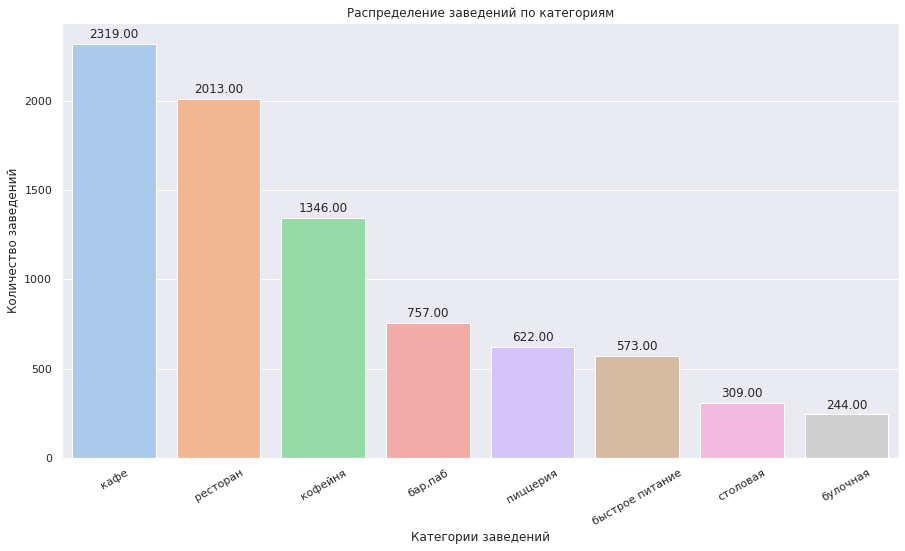

In [32]:
make_barplot(categories, 'categories', 'count', 'Категории заведений', 'Количество заведений', 'Распределение заведений по категориям')

Кафе занимают лидирующую позицию по количеству заведений - их свыше 2300 штук. На втором месте рестораны, которых около 2000 заведений, и на третьем кофейни - в этой категории чуть меньше 1400 заведений. 

<a id='section_id32'></a>
### Количество посадочных мест по категориям

Исследуем количество посадочных мест в местах по категориям и визуализируем данные.

Для начала найдем суммарное количество мест в каждой категории.

In [33]:
categories_seats = (data
                    .groupby('category', as_index=False)
                    .agg({'seats': 'sum'})
                    .sort_values(by='seats', ascending=False)
                   )
categories_seats

,category,seats
6,ресторан,149036
3,кафе,115617
4,кофейня,78709
0,"бар,паб",55506
5,пиццерия,39062
2,быстрое питание,34066
7,столовая,16359
1,булочная,13225


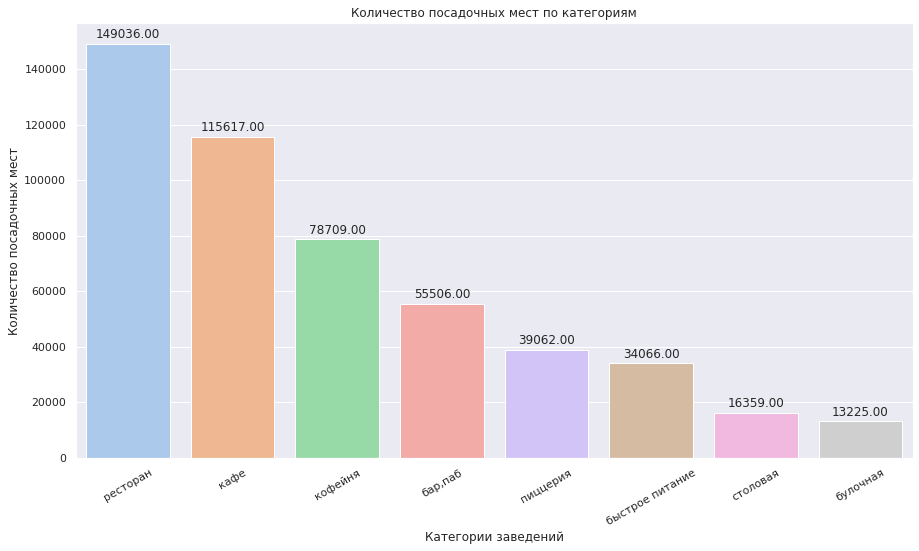

In [34]:
make_barplot(categories_seats, 'category', 'seats', 'Категории заведений', 'Количество посадочных мест', 'Количество посадочных мест по категориям')

Рестораны, которые были на втором месте по количестве заведений, поменялись местами с кафе. Суммарное количество посадочных мест в них свыше 147 тысяч.

Теперь построим ящики с усами, чтобы посмотреть на медианные значения количества мест, выбросы и квантили в каждой категории. 

Для этого заполним пропуски 0, чтобы не учитывать их при построении графика. 

In [35]:
data['seats'] = data['seats'].fillna(0)

In [36]:
data_seats = data.query('seats > 0')

In [37]:
bp_seats = px.box(data_seats,
             y = 'seats', 
             x = 'category',
             title = 'Распределение посадочных мест по категориям',
             template = 'plotly_white',
             color = 'category',
             color_discrete_map = {'ресторан': '#9EB9F3', 'кафе': '#F89C74', 'кофейня': '#8BE0A4',
                                  'пиццерия': '#DCB0F2', 'бар,паб': '#ED8579', 'быстрое питание': '#D9AF6B', 
                                  'столовая': '#FE88B1', 'булочная': '#B3B3B3'}
       )

bp_seats.update_yaxes(range=[0, 600])
bp_seats.update_layout(
    xaxis_title = 'Категории заведений',
    yaxis_title = 'Количество посадочных мест')


По медианному количеству мест рестораны также занимают первое место - в этой категории ее значение 90. На втором месте бары и пабы с медианой 84, а на третьем столовые и кофейни, в обеих категориях медиана - ровно 80 посадочных мест. Отметим, что на графике суммарного количества мест столовые занимали предпоследнее место - несмотря на то, что в датасете их немного, в этой категории у половины заведений больше 80 посадочных мест.


Самое низкое значение медианы в категориях пиццерия и булочная (их медиана 56). Почти во всех категориях выбросы достигают отметки в 500 посадочных мест.

<a id='section_id33'></a>
### Соотношение сетевых и несетевых заведений

Посмотрим, сколько в датасете сетевых и несетевых заведений. 

In [38]:
data_chains = (data['chain']
               .replace([0, 1], ['Несетевые', 'Сетевые'])
               .reset_index()
               .groupby('chain')['chain'].count())
data_chains

chain
Несетевые    5084
Сетевые      3099
Name: chain, dtype: int64

In [39]:
def make_pie(data, labels, title):
    plt.figure(figsize=(15,8))
    
    colors = sns.color_palette('pastel', len(labels))
    
    plt.pie(data, labels=labels, autopct='%.0f%%', colors=colors)
    plt.title(title)

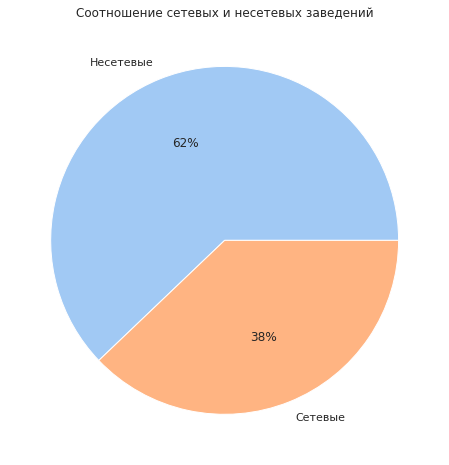

In [40]:
make_pie(data_chains, ['Несетевые', 'Сетевые'], 'Соотношение сетевых и несетевых заведений')

Несетевых заведений больше сетевых: 62% против 38%.

<a id='section_id34'></a>
### Категории сетевых заведений

Посмотрим, какие категории заведений чаще являются сетевыми.

In [41]:
#найдем количество сетевых заведений по категориям
chain_only = (data
              .query('chain == 1')
              .pivot_table(index='category', values='name', aggfunc='count'))

#найдем общее количество заведений по категориям
all_data = (data
           .pivot_table(index='category', values='name', aggfunc='count'))

#соединим таблицы
chain_only = (pd.merge(chain_only, all_data, on=('category'), how ='left')
              .reset_index()
              .rename(columns={'category': 'category', 'name_x': 'chain', 'name_y': 'total'}))

#найдем процент сетевых заведений в общем количестве заведений 
chain_only['%_chain'] = round(chain_only['chain'] * 100 / chain_only['total'], 2)
chain_only.sort_values(by='%_chain', ascending=False, inplace=True)
chain_only

,category,chain,total,%_chain
1,булочная,152,244,62.30
5,пиццерия,324,622,52.09
4,кофейня,672,1346,49.93
2,быстрое питание,221,573,38.57
6,ресторан,717,2013,35.62
3,кафе,760,2319,32.77
7,столовая,87,309,28.16
0,"бар,паб",166,757,21.93


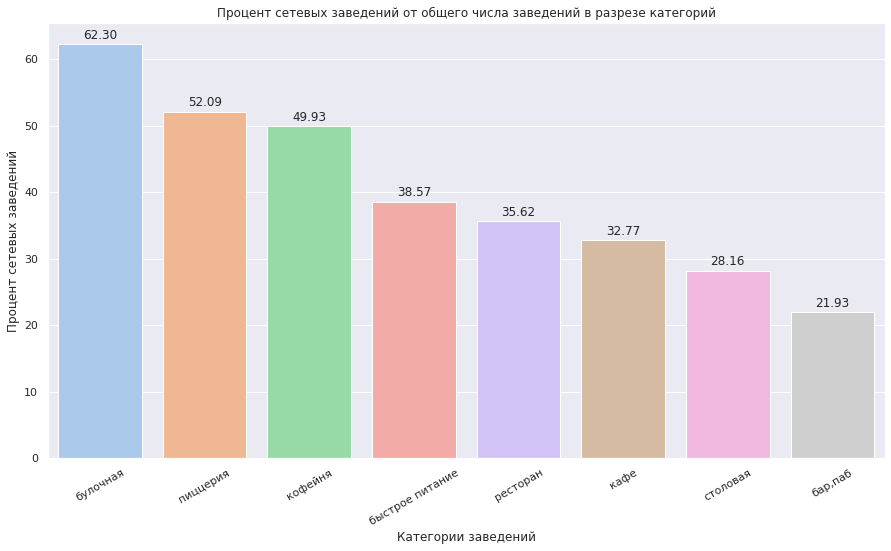

In [42]:
make_barplot(chain_only, 'category', '%_chain', 'Категории заведений', 'Процент сетевых заведений', 'Процент сетевых заведений от общего числа заведений в разрезе категорий')

Если рассматривать количество сетевых заведений относительно общего числа заведений, то лидируют следующие категории: булочные, пиццерии, кофейни. Сетевых заведений в данных категориях больше 50% от общего числа точек. Кафе, столовые, бары и пабы, однако, оказываются в меньшинстве - на сетевые заведения в этих категориях приходится от 30 до 20%.

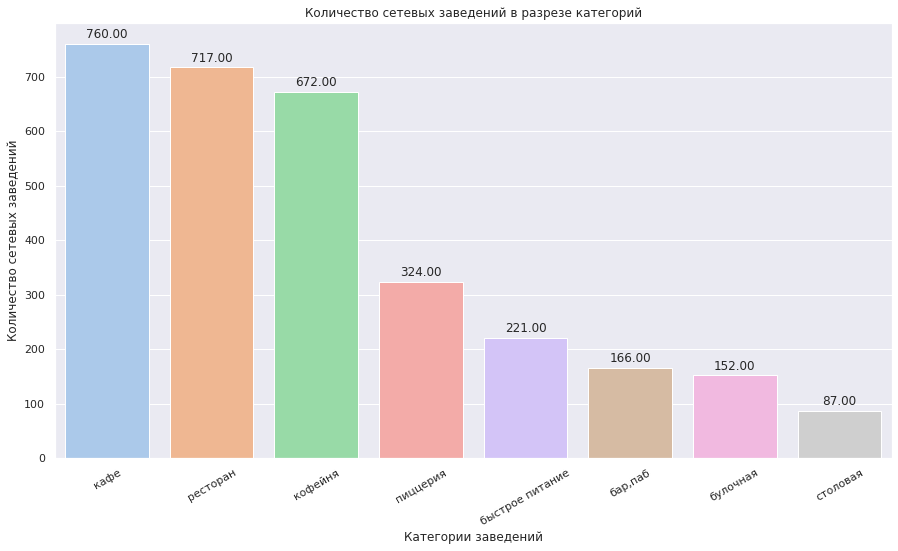

In [43]:
make_barplot(chain_only.sort_values(by='chain', ascending=False), 'category', 'chain', 'Категории заведений', 'Количество сетевых заведений', 'Количество сетевых заведений в разрезе категорий')

Если же смотреть на ситуацию в абсолютных числах, то самая популярная категория сетевых заведений - кафе, после идут рестораны и кофейни. Меньше всего сетевых заведений относительного общего количества сетевых заведений в категории столовые и булочные. 

<a id='section_id35'></a>
### Топ-15 популярных заведений в Москве

Найдем 15 самых популярных сетей в Москве и подумаем, что их объединяет.

In [44]:
top_15 = (data
          .query('chain == 1')
          .groupby('name').agg({'name': 'count'})
          .rename(columns={'name': 'name', 'name': 'count'})
          .sort_values(by='count', ascending=False)[:15]
          .reset_index()
         )

#заменим название 10 заведения на более короткое, чтобы график не смещался слишком вправо
top_15.replace('Кулинарная лавка братьев Караваевых', 'КЛ братьев Караваевых', inplace=True)
top_15

,name,count
0,Шоколадница,119
1,Домино'с Пицца,75
2,Додо Пицца,73
3,One Price Coffee,68
4,Яндекс Лавка,64
5,Prime,50
6,Хинкальная,44
7,КОФЕПОРТ,42
8,КЛ братьев Караваевых,39
9,Чайхана,36


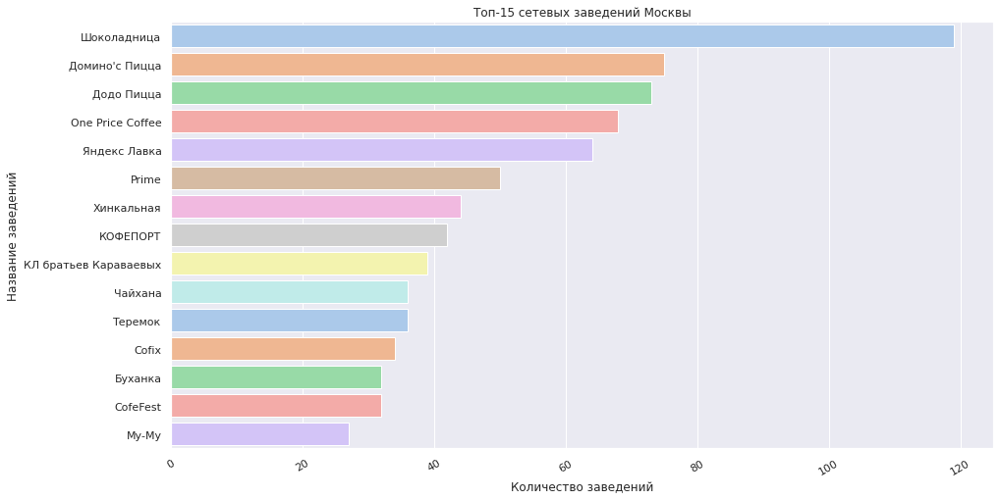

In [45]:
make_barplot(top_15, 'count', 'name', 'Количество заведений', 'Название заведений', 'Топ-15 сетевых заведений Москвы', False)

Самые популярные сетевые заведения в Москве: Шоколадница, Домино'с Пицца и Додо Пицца. Шоколадница лидирует с большим отрывом - это единственная сеть, у которой больше 100 заведений по всему городу. Все заведения относятся к кафе и быстрому питанию, там можно быстро и относительно недорого перекусить. 

Почти все 15 заведений объединяют бюджетные цены, доступность по всему городу (они все расположены в проходимых местах, ТЦ, около метро и т.д), быстрое обслуживание. Выделяется только Яндекс Лавка, которая не является оффлайн заведением и доставляет блюда и продукты домой.

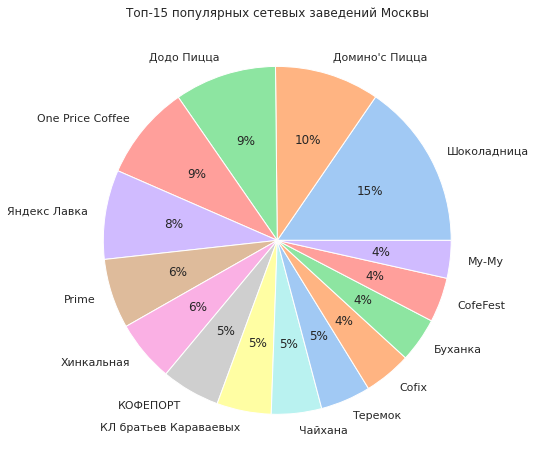

In [46]:
make_pie(top_15['count'], top_15['name'], 'Топ-15 популярных сетевых заведений Москвы')

Из круговой диаграммы видно, что ни одно из 14 заведений не имеет больше 10% точек от суммарного количества 15 заведений, Шоколадница с 15% - самая распространенная сеть. 
В основном у заведений от 4 до 9% точек.

Посмотрим, к какой категории относится каждое из заведений.

In [47]:
chain_top_15 = (data[data['chain'] == 1]
                .groupby(['name', 'category'])
                .agg({'name' : 'count'}))

chain_top_15.columns = ['count']

chain_top_15 = (chain_top_15
                .sort_values('count', ascending = False)
                .reset_index()
                .head(15))

chain_top_15.head(15)

,name,category,count
0,Шоколадница,кофейня,118
1,Домино'с Пицца,пиццерия,75
2,Додо Пицца,пиццерия,73
3,One Price Coffee,кофейня,68
4,Яндекс Лавка,ресторан,64
5,Prime,ресторан,49
6,КОФЕПОРТ,кофейня,42
7,Кулинарная лавка братьев Караваевых,кафе,39
8,Теремок,ресторан,34
9,Cofix,кофейня,34


<a id='section_id36'></a>
### Количество заведений в административных районах

Посмотрим, какие административные районы Москвы присутствуют в датасете.

In [48]:
list(data['district'].unique())

['Северный административный округ',
 'Северо-Восточный административный округ',
 'Северо-Западный административный округ',
 'Западный административный округ',
 'Центральный административный округ',
 'Восточный административный округ',
 'Юго-Восточный административный округ',
 'Южный административный округ',
 'Юго-Западный административный округ']

Отобразим общее количество заведений и количество заведений каждой категории по районам. 

In [49]:
data_districts = data.pivot_table(index = 'district', columns = 'category' , values = 'name', aggfunc='count')
data_districts['sum'] = data_districts.sum(axis=1, numeric_only=True)
data_districts = data_districts.sort_values(by='sum', ascending=False)
data_districts

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,sum
district,,,,,,,,,
Центральный административный округ,364,50,85,461,413,113,667,65,2218
Северный административный округ,67,36,54,233,184,77,187,40,878
Северо-Восточный административный округ,62,26,80,261,153,67,180,40,869
Южный административный округ,67,23,81,254,118,69,193,43,848
Западный административный округ,48,37,60,235,144,70,214,24,832
Восточный административный округ,53,23,69,261,99,71,155,39,770
Юго-Западный административный округ,38,26,58,231,95,63,168,17,696
Юго-Восточный административный округ,36,11,57,273,81,55,141,25,679
Северо-Западный административный округ,22,12,29,110,59,37,108,16,393


In [50]:
def make_stacked_plot(data, title, xlabel, ylabel):
    
    colors = sns.color_palette('pastel')
    
    ax = data.plot.bar(stacked = True, figsize=(15,8), rot=30)

    for i, rect in enumerate(ax.patches):
        height = rect.get_height()
        width = rect.get_width()
        x = rect.get_x()
        y = rect.get_y()

        label_text = f'{height:.0f}'

        label_x = x + width / 2
        label_y = y + height / 2

        if height > 0.001:
            ax.text(label_x, label_y, label_text, ha='center', va='center', fontsize=8)


    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel);


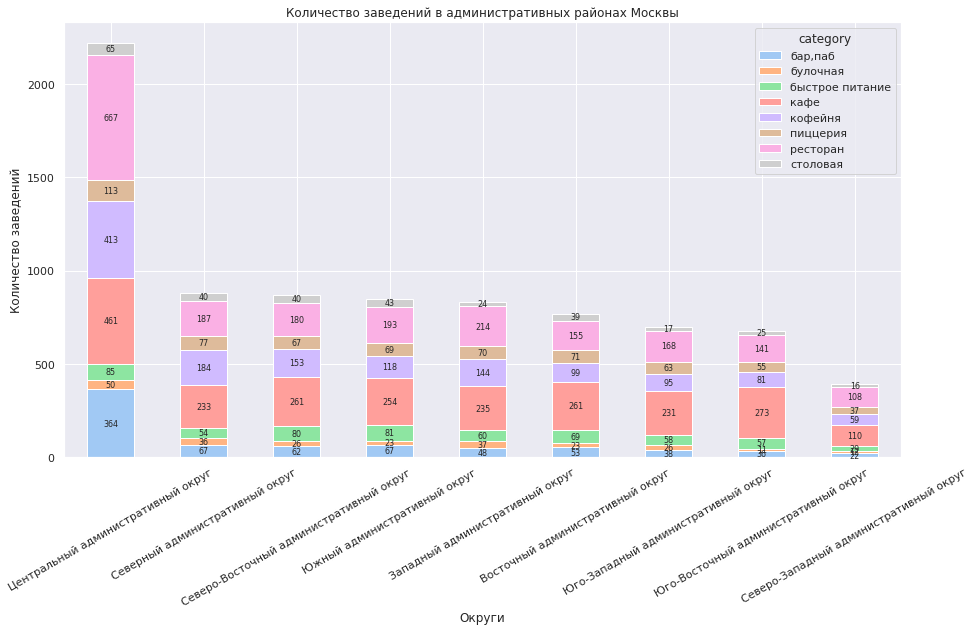

In [51]:
make_stacked_plot(data_districts.iloc[:, 0:8], 'Количество заведений в административных районах Москвы', 'Округи', 'Количество заведений')

На данном графике указано количество заведений каждой категории по всем районам Москвы. Ожидаемо, самое большое количество заведений в ЦАО, в остальных районах количество заведений распределено более-менее одинаково (кроме СЗАО, где менее 500 заведений). Что интересно, категории во всех районах представлены в одинаковых пропорциях, разнятся лишь абсолютные значения.

<a id='section_id37'></a>
###  Распределение средних рейтингов по категориям заведений

Распределим средние рейтинги по категориям заведений и посмотрим на полученные результаты.

In [52]:
data_rating = (data
               .pivot_table(index = 'category' , values = 'rating', aggfunc='mean')
               .sort_values(by='rating', ascending=False)
               .reset_index())

data_rating['rating'] = round(data_rating['rating'], 2)
data_rating

,category,rating
0,"бар,паб",4.39
1,пиццерия,4.30
2,ресторан,4.29
3,булочная,4.29
4,кофейня,4.28
5,столовая,4.21
6,кафе,4.13
7,быстрое питание,4.06


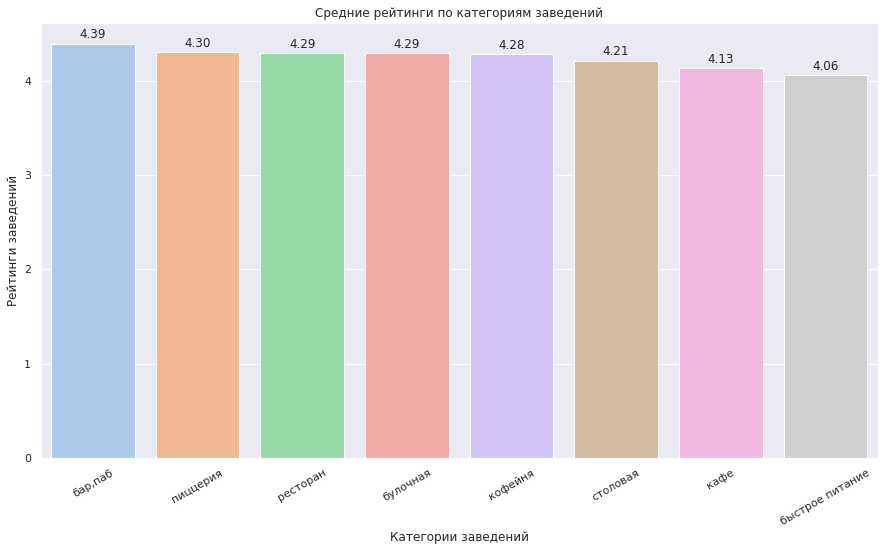

In [53]:
make_barplot(data_rating, 'category', 'rating', 'Категории заведений', 'Рейтинги заведений', 'Средние рейтинги по категориям заведений')

У всех категорий средний рейтинг заведений не опускаается ниже 4, однако самые рейтинговые категории - бар/паб, пиццерия и ресторан (4.39, 4.30, 4.29 соответственно). Самые низкие рейтинги - кафе и быстрое питание (4.13 и 4.06 соответственно).

<a id='section_id38'></a>
###  Фоновая картограмма со средним рейтингом заведений каждого района

Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района.

Для этого сделаем сводную таблицу с рейтингами для районов. 

In [54]:
district_rating = (data
               .pivot_table(index = 'district' , values = 'rating', aggfunc='mean')
               .sort_values(by='rating', ascending=False)
               .reset_index())

district_rating['rating'] = round(district_rating['rating'], 2)
district_rating

,district,rating
0,Центральный административный округ,4.38
1,Северный административный округ,4.24
2,Северо-Западный административный округ,4.21
3,Южный административный округ,4.19
4,Западный административный округ,4.18
5,Восточный административный округ,4.18
6,Юго-Западный административный округ,4.17
7,Северо-Восточный административный округ,4.15
8,Юго-Восточный административный округ,4.11


In [55]:
def make_choropleth(data, columns, title):
    state_geo = '/datasets/admin_level_geomap.geojson'

    moscow_lat, moscow_lng = 55.751244, 37.618423

    m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

    Choropleth(
        geo_data=state_geo,
        data=data,
        columns=columns,
        key_on='feature.name',
        fill_color='YlGn',
        fill_opacity=0.8,
        legend_name=title,
    ).add_to(m)

    return m

In [56]:
make_choropleth(district_rating, ['district', 'rating'], 'Средний рейтинг заведений по районам')

Видно, что самые высокие рейтинги в заведениях ЦАО, чуть менее высокие в двух районах на севере Москвы, в остальном распределение довольно равномерное. 

<a id='section_id39'></a>
### Заведения датасета на карте

Отобразим все заведения датасета на карте с помощью кластеров средствами библиотеки folium.

In [57]:
def make_cluster_map(data):
    moscow_lat, moscow_lng = 55.751244, 37.618423

    m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")

    marker_cluster = MarkerCluster().add_to(m)


    def create_clusters(row):
        Marker(
            [row['lat'], row['lng']],
            popup=f"{row['name']} {row['rating']}",
        ).add_to(marker_cluster)

    data.apply(create_clusters, axis=1)

    return m

In [58]:
make_cluster_map(data)

Кластеры показывают, что в центре сконцентрировано самое большое количество заведений, а на периферии их больше всего на северо-западе и юго-западе Москвы.

<a id='section_id310'></a>
### Топ-15 улиц по количеству заведений

Найдем топ-15 улиц по количеству заведений и построим график распределения количества заведений и их категорий по этим улицам.

In [59]:
top_15_streets = data.pivot_table(index = 'street', columns = 'category' , values = 'name', aggfunc='count')
top_15_streets['sum'] = top_15_streets.sum(axis=1, numeric_only=True)
top_15_streets = top_15_streets.sort_values(by='sum', ascending=False)[:15]
top_15_streets.fillna(0, inplace=True)
top_15_streets

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,sum
street,,,,,,,,,
проспект Мира,11.0,4.0,21.0,53.0,35.0,11.0,45.0,2.0,182.0
Профсоюзная улица,6.0,4.0,15.0,31.0,18.0,14.0,26.0,3.0,117.0
Ленинский проспект,10.0,3.0,2.0,26.0,23.0,5.0,33.0,5.0,107.0
Ленинградский проспект,15.0,4.0,2.0,12.0,25.0,9.0,25.0,3.0,95.0
проспект Вернадского,5.0,1.0,12.0,23.0,12.0,11.0,29.0,2.0,95.0
Дмитровское шоссе,5.0,2.0,10.0,22.0,11.0,8.0,24.0,4.0,86.0
Каширское шоссе,2.0,0.0,10.0,20.0,15.0,5.0,18.0,5.0,75.0
Варшавское шоссе,6.0,0.0,7.0,17.0,14.0,4.0,18.0,7.0,73.0
Ленинградское шоссе,5.0,2.0,5.0,13.0,13.0,3.0,25.0,3.0,69.0


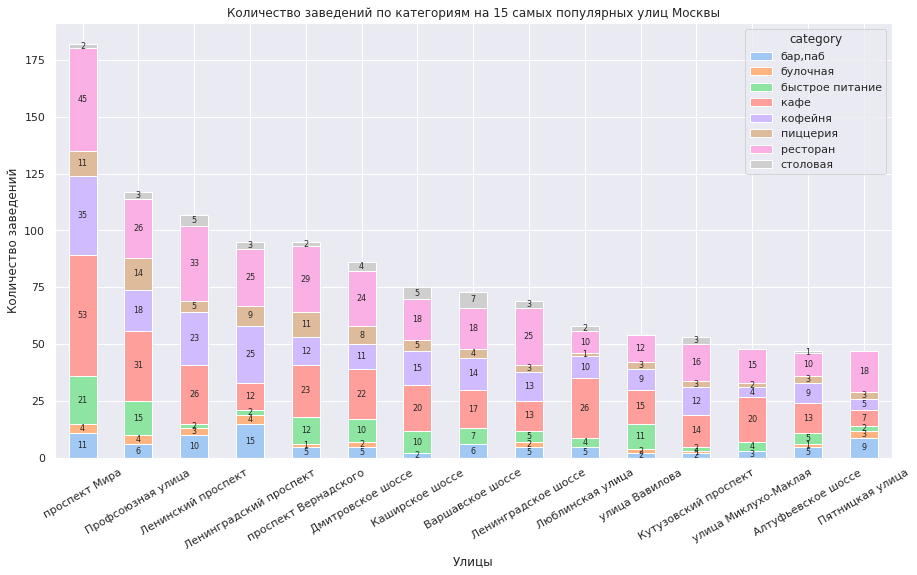

In [60]:
make_stacked_plot(top_15_streets.iloc[:, :8], 'Количество заведений по категориям на 15 самых популярных улиц Москвы', 'Улицы', 'Количество заведений')

Самые популярные улицы по количеству заведений: проспект Мира, Профсоюзная улица и Ленинский проспект. Это улицы ЦАО и ЮЗАО. На всех улицах высокое количество ресторанов, кафе и кофеен относительно заведений других категорий. 

<a id='section_id311'></a>
### Улицы, на которых находится только один объект общепита

Посмотрим на улицы, на которых расположен только один объект общественного питания. 

In [61]:
one_obj_streets = (data
                  .pivot_table(index = 'street', values = 'name', aggfunc='count')
                  .query('name == 1')
                 )
one_obj_streets


,name
street,
1-й Автозаводский проезд,1
1-й Балтийский переулок,1
1-й Варшавский проезд,1
1-й Вешняковский проезд,1
1-й Голутвинский переулок,1
...,...
улица Чечулина,1
улица Чистова,1
улица Шкулёва,1


Таких улиц довольно много - 414 штук. Это малоинформативная таблица, посмотрим на районы, где расположены эти улицы, и посмотрим, какую долю они составляют в каждом районе. 

In [62]:
one_obj_streets_districts = (data
                             .query('street in @one_obj_streets.index')
                             .groupby('district')
                             .count()['name']
                             .sort_values(ascending=False)
                             .reset_index()
                             .rename({'name': 'count'}, axis=1)
                            )

one_obj_streets_districts['%'] = round(one_obj_streets_districts['count'] * 100 / one_obj_streets_districts['count'].sum(), 2)
one_obj_streets_districts

,district,count,%
0,Центральный административный округ,134,32.37
1,Северо-Восточный административный округ,50,12.08
2,Северный административный округ,47,11.35
3,Восточный административный округ,45,10.87
4,Южный административный округ,36,8.70
5,Западный административный округ,35,8.45
6,Юго-Восточный административный округ,34,8.21
7,Северо-Западный административный округ,19,4.59
8,Юго-Западный административный округ,14,3.38


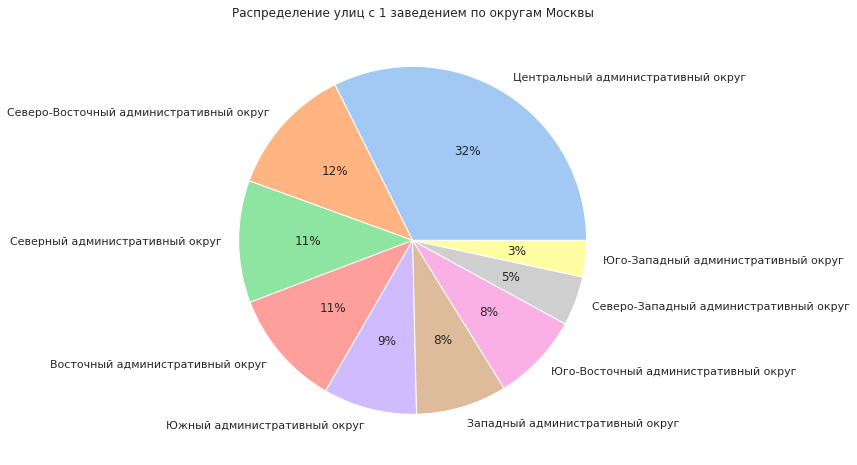

In [63]:
make_pie(one_obj_streets_districts['count'], one_obj_streets_districts['district'], 'Распределение улиц с 1 заведением по округам Москвы')

Самый высокий процент улиц с одним заведений в ЦАО - 32% от общего количества таких улиц. Это ожидаемо, поскольку в ЦАО в принципе больше всего улиц. Затем идут СВАО и ВАО, где таких улиц 11%. Меньше всего таких улиц в СЗАО и ЮЗАО - 5 и 3% соответственно.

<a id='section_id312'></a>
### Медиана столбца middle_avg_bill для каждого района

Посчитаем медиану столбца middle_avg_bill для каждого района. 

In [64]:
middle_bill_districts = (data
                        .pivot_table(index = 'district', values = 'middle_avg_bill', aggfunc='median')
                        .reset_index()
                        .sort_values(by='middle_avg_bill', ascending=False))
middle_bill_districts

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,650.0
0,Восточный административный округ,600.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,475.0


Построим хопроплет с полученными медианами для каждого района.

In [65]:
make_choropleth(middle_bill_districts, ['district', 'middle_avg_bill'], 'Медианный чек по районам')

Самый высокий медианный чек в ЦАО и ЗАО - 1000 рублей. Чем дальше от центра, тем ниже это значение. В трех районах (СВАО, ЮАО и ЮВАО) это значение 500 и ниже. 

<a id='section_id313'></a>
### Вывод

Самые популярные категории заведений в Москве: кафе, рестораны и кофейни.

В ресторанах, пабах, кофейнях и столовых самые высокие медианные значения посадочных мест - эти категории следует рассмотреть, если планируется открытие большого объекта. 

Несетевых заведений в Москве больше - 62% на 38%. Среди сетевых заведений популярна та же тройка заведений, что и в целом по датасету: кафе, рестораны, кофейни. Среди сетевых заведений самыми популярными оказались Шоколадница, Домино'с Пицца и Додо Пицца.

Наиболее популярный район Москвы по количеству заведений - Центральный. Наименее популярный - СЗАО.

Самые высокие оценки в среднем получили заведения в категории бары и пабы - 4.39. Затем идут пиццерии и рестораны. 

По количеству заведений лидируют проспект Мира, Профсоюзная улица и Ленинский проспект. Большинство улиц с одним заведением находятся в ЦАО - в этом административном районе таких улиц 135 штуки. 

По медианному чеку ЦАО и ЗАО опередили все остальные районы, в СВАО, ЮАО и ЮВАО это значение оказалось самым низким.

<a id='section_id4'></a>
## Детализация исследования

Более детально изучим некоторые аспекты о кофейнях, чтобы резюмировать исследование и дать рекомендации для открытия кофейни.

<a id='section_id41'></a>
### Расположение кофеен

Найдем, сколько всего кофеен в датасете.

In [66]:
cafes = data.query('category == "кофейня"')
cafes['name'].count()

1346

Теперь узнаем, в каких районах они чаще всего расположены.

In [67]:
cafes_districts = (cafes
                   .pivot_table(index = 'district', values = 'name', aggfunc='count')
                   .reset_index()
                   .sort_values(by='name', ascending=False)
                   .rename({'name': 'count'}, axis=1))
cafes_districts 

,district,count
5,Центральный административный округ,413
2,Северный административный округ,184
3,Северо-Восточный административный округ,153
1,Западный административный округ,144
8,Южный административный округ,118
0,Восточный административный округ,99
7,Юго-Западный административный округ,95
6,Юго-Восточный административный округ,81
4,Северо-Западный административный округ,59


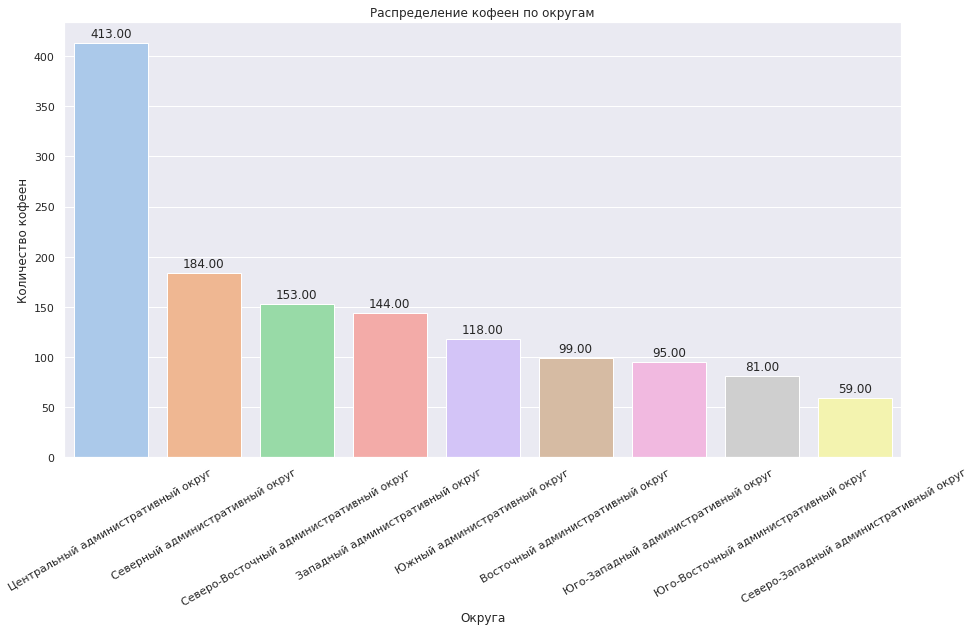

In [68]:
make_barplot(cafes_districts, 'district', 'count', 'Округа', 'Количество кофеен', 'Распределение кофеен по округам')

Больше всего кофеен в ЦАО, САО и СВАО. Меньше всего - в ЮЗАО, ЮВАО и СЗАО.

In [69]:
make_cluster_map(cafes)

Основная масса кофеен сосредоточена ближе к центру Москвы, либо в прилегающих к нему районах, на периферии минимальное количество точек.

<a id='section_id42'></a>
### Круглосуточные кофейни

Проверим, есть ли в датасете круглосуточные кофейни.

In [70]:
cafes_24 = cafes[cafes['is_24/7'] == True]
list(cafes_24['name']), len(cafes_24)

(['Wild Bean',
  'Wild Bean Cafe',
  'Wild Bean Cafe',
  'Wild Bean Cafe',
  'Шоколадница',
  'Кофе Хауз',
  'Кофемания',
  'You&coffee',
  'Кофемания',
  'Cinnabon',
  'Шоколадница',
  'One Price Coffee',
  'Кофейня One&Double',
  'Cofix',
  'Кофе с собой',
  'Wild Bean',
  'Wild Bean',
  'Шоколадница',
  'Шоколадница',
  'Пирог Хауз',
  'You&coffee',
  'Кофемания',
  'Молоко',
  'Кофемания',
  'Кофе Хауз',
  'Гоголь-Моголь',
  'Кофемания',
  'Кофемания',
  'Шоколадница',
  'One And Double',
  'Шоколадница',
  'Кофе Хауз',
  'Шоколадница',
  'Шоколадница',
  'Столица',
  'Кофемания',
  'Cofix',
  'Лаванда Кофе',
  'Шоколадница',
  'Шоколадница',
  'Кофе On',
  'Шоколадница',
  'One&Double',
  'Шоколадница',
  'Шоколадница',
  'Кофе с собой',
  'Шоколадница',
  'FoodMoscowCoffee',
  'Шоколадница',
  'Шоколадница',
  'Шоколадница',
  'Wild Bean Cafe',
  'The wild bean cafe',
  'One more, please',
  'Wild Bean Cafe',
  'Wild Bean'],
 56)

Круглосуточные кофейни - это в основном сетевые заведения и экспресс-кофейни, таких кофеен 56 штук на весь датасет.

In [71]:
#Код ревьюера
coffeehouse_24_7 = cafes[cafes['is_24/7'] == True]
coffeehouse_24_7.count()[0]

56

<a id='section_id43'></a>
### Рейтинги кофеен

Узнаем, какие рейтинги у кофеен. Для начала найдем общую медиану.

In [72]:
cafes['rating'].median()

4.3

Посмотрим на распределение средних рейтингов по районам.

In [73]:
cafes_rating = (cafes
               .pivot_table(index = 'district', values = 'rating', aggfunc = 'mean')
               .sort_values(by='rating', ascending=False)
               .reset_index())
cafes_rating['rating'] = round(cafes_rating['rating'], 2)
cafes_rating

,district,rating
0,Центральный административный округ,4.34
1,Северо-Западный административный округ,4.32
2,Северный административный округ,4.29
3,Юго-Западный административный округ,4.29
4,Восточный административный округ,4.28
5,Южный административный округ,4.25
6,Северо-Восточный административный округ,4.23
7,Юго-Восточный административный округ,4.22
8,Западный административный округ,4.19


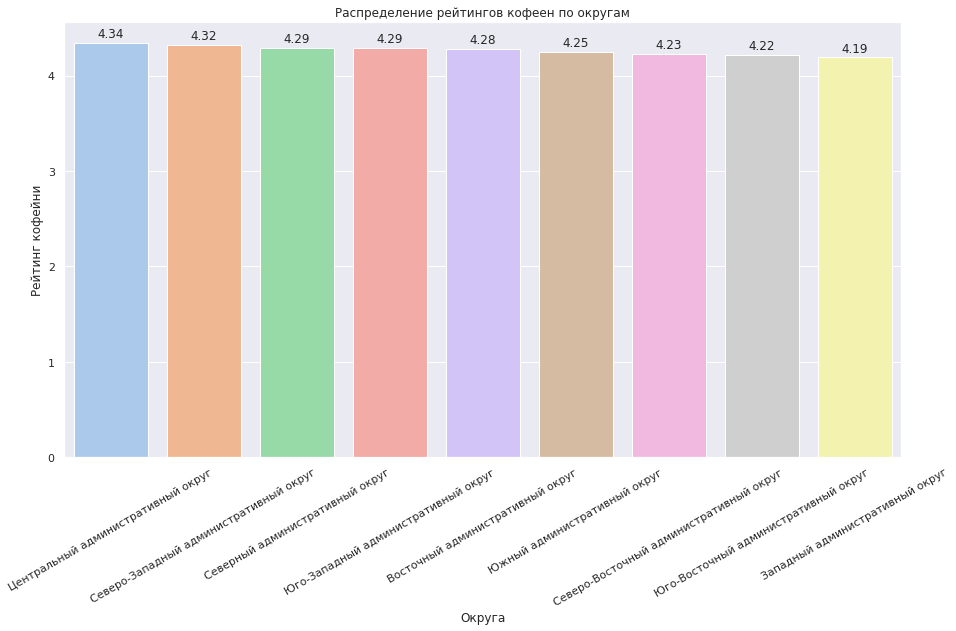

In [74]:
make_barplot(cafes_rating, 'district', 'rating', 'Округа', 'Рейтинг кофейни', 'Распределение рейтингов кофеен по округам')

Лидеры по среднему рейтингу кофеен: ЦАО, СЗАО, САО. Самый низкий рейтинг относительно кофеен в других районах в СВАО и ЗАО. Однако разница между первым и последним местом невелика: 4.34 против 4.19.

<a id='section_id44'></a>
### Цена чашки капучино при открытии кофейни

Выявим, на какую стоимость чашки капучино стоит ориентироваться при открытии. Для этого найдем медианнюу цену капучино в несетевых кофейнях - именно такую планирует открыть заказчик. 

In [75]:
cafes.query('chain == 0')['middle_coffee_cup'].mean()

178.6259842519685

Так как кофейня планируется небольшая, посмотрим на медианную цену в небольших кофейнях - до 30 посадочных мест.

In [76]:
cafes.query('chain == 0 and seats < 30')['middle_coffee_cup'].mean()

177.67073170731706

Стоит ориентироваться на цену в 175 рублей, которая является средней по Москве для данного типа кофеен.

<a id='section_id45'></a>
### Вывод

Если открывать кофейню в ЦАО, нужно быть готовым к конкуренции, потому что в этом районе сконцентрировано самое большое количество кофеен. Для открытия можно выбрать район со средним количеством кофеен - так будет соблюден баланс между потенциальным количеством посетителей и кофеен-конкурентов. Стоит рассмотреть ЗАО, ЮАО и ВАО.

Круглосуточные кофейни обычно сетевые, поэтому это не вариант для маленькой авторской кофейни.

Самые рейтинговые кофейни расположены в ЦАО, СЗАО и САО. Возможно, имеет смысл рассмотреть ЗАО с наименьшим средним рейтингом - судя по всему, там меньше кофеен с высоким уровнем обслуживания. 

Чашку кофе капучино имеет смысл сделать средней по рынку - она составляет около 175 рублей.

<a id='section_id5'></a>
## Презентация

Презентация: https://disk.yandex.ru/i/tWq_ml0lt6_hTg